In [1]:
%load_ext autoreload
%autoreload 2

import os, sys
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress TensorFlow info messages

print(sys.version)

import tensorflow as tf
print(tf.__version__)

from src.preprocessing import *
from src.display import *
from src.training import *
from src.plot import plot_training_history

3.10.14 (main, May  6 2024, 19:42:50) [GCC 11.2.0]
2.17.0


In [2]:
print(tf.config.list_physical_devices('GPU'))

[]


I0000 00:00:1729872192.719408    7522 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355


## Preprocessing

In [3]:
train_folder = "data/train"
val_folder = "data/validation"

nii_images_train = list_nii_files(train_folder, 'Flair-Brain.nii')
nii_masks_train = list_nii_files(train_folder, 'LesionSeg-Flair.nii')
nii_images_val = list_nii_files(val_folder, 'Flair-Brain.nii')
nii_masks_val = list_nii_files(val_folder, 'LesionSeg-Flair.nii')


In [4]:
images_train = load_all_data(nii_images_train)
masks_train = load_all_data(nii_masks_train)
images_val = load_all_data(nii_images_val)
masks_val = load_all_data(nii_masks_val)

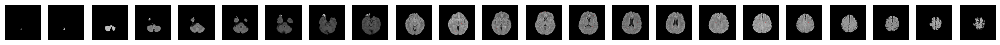

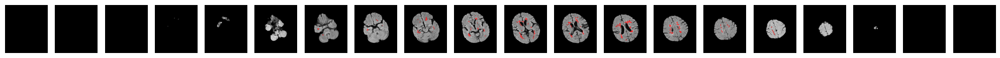

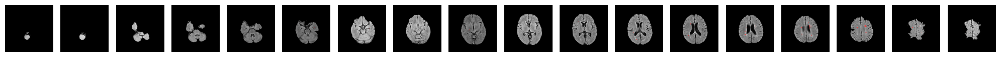

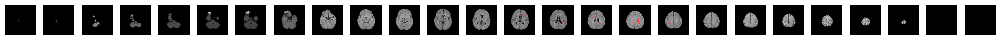

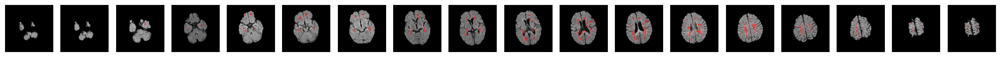

In [5]:
for i, (image, mask) in enumerate(zip(images_train[:5], masks_train[:5])):
    display_image(image, mask, rows=1)

In [6]:
resized_images_train = resize_all_images(images_train)
resized_masks_train = resize_all_images(masks_train)

resized_images_val = resize_all_images(images_val)
resized_masks_val = resize_all_images(masks_val)

# assert that the shapes are the same in mask and scan (x and y dimensions)
# for image, mask in zip(resized_images_train, resized_masks_train):
#     assert image.shape[:-1] == mask.shape[:-1]

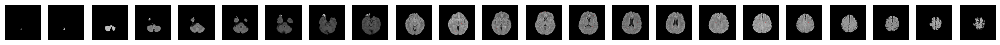

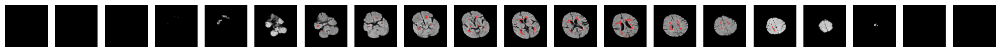

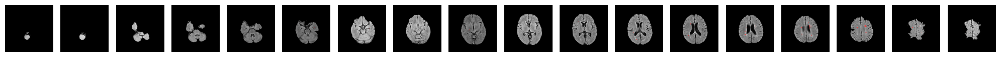

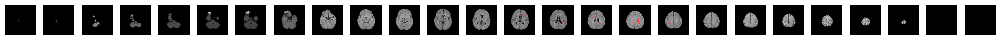

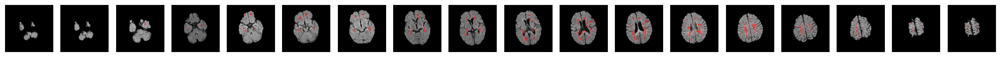

In [7]:
for i, (image, mask) in enumerate(zip(resized_images_train[:5], resized_masks_train[:5])):
    display_image(image, mask, rows=1)

In [8]:
normalized_images_train = normalize_images(resized_images_train)
normalized_images_val = normalize_images(resized_images_val)

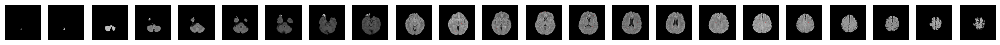

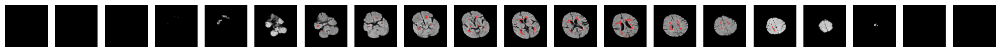

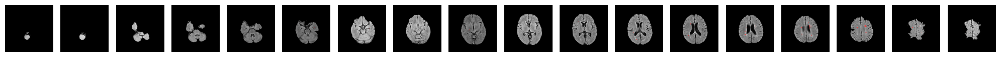

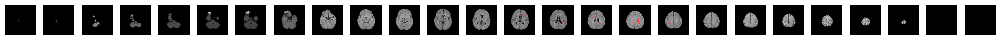

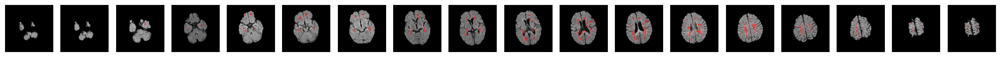

In [9]:
for i, (image, mask) in enumerate(zip(normalized_images_train[:5], resized_masks_train[:5])):
    display_image(image, mask, rows=1)

In [10]:
# Keep only slices that contain lesions
filtered_images_train, filtered_masks_train = filter_slices_with_lesions(normalized_images_train, resized_masks_train)
filtered_images_val, filtered_masks_val = filter_slices_with_lesions(resized_images_val, resized_masks_val)

# Output the number of slices remaining for each scan after filtering
for i, (filtered_image_train, filtered_mask_train) in enumerate(zip(filtered_images_train, filtered_masks_train)):
    print(f"Scan {i + 1}: {filtered_image_train.shape[-1]} slices remaining, corresponding mask shape: {filtered_mask_train.shape}")

Scan 1: 13 slices remaining, corresponding mask shape: (256, 256, 13)
Scan 2: 10 slices remaining, corresponding mask shape: (256, 256, 10)
Scan 3: 12 slices remaining, corresponding mask shape: (256, 256, 12)
Scan 4: 10 slices remaining, corresponding mask shape: (256, 256, 10)
Scan 5: 16 slices remaining, corresponding mask shape: (256, 256, 16)
Scan 6: 12 slices remaining, corresponding mask shape: (256, 256, 12)
Scan 7: 7 slices remaining, corresponding mask shape: (256, 256, 7)
Scan 8: 13 slices remaining, corresponding mask shape: (256, 256, 13)
Scan 9: 4 slices remaining, corresponding mask shape: (256, 256, 4)
Scan 10: 13 slices remaining, corresponding mask shape: (256, 256, 13)
Scan 11: 14 slices remaining, corresponding mask shape: (256, 256, 14)
Scan 12: 7 slices remaining, corresponding mask shape: (256, 256, 7)
Scan 13: 19 slices remaining, corresponding mask shape: (256, 256, 19)
Scan 14: 13 slices remaining, corresponding mask shape: (256, 256, 13)
Scan 15: 12 slices re

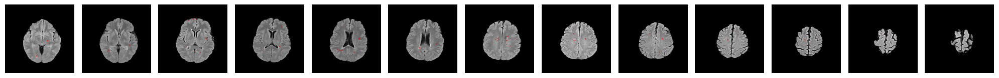

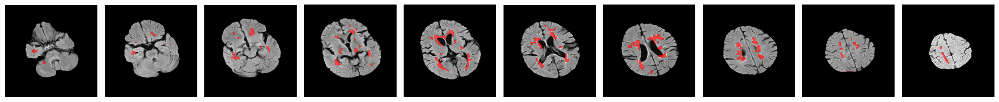

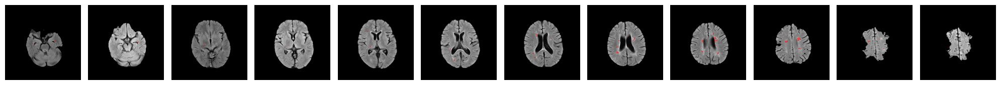

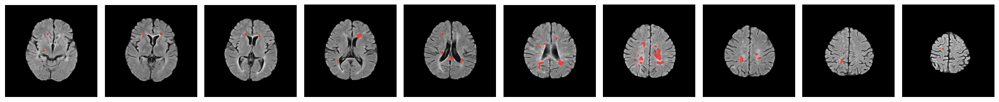

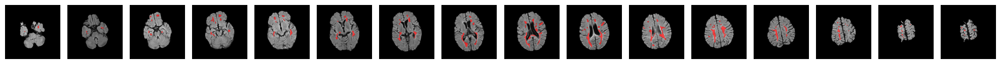

In [11]:
for i, (image, mask) in enumerate(zip(filtered_images_train[:5], filtered_masks_train[:5])):
    display_image(image, mask, rows=1)

In [12]:
# Stack 2D slices from all images
all_slices_train = stack_slices(filtered_images_train)
all_masks_train = stack_slices(filtered_masks_train)
all_slices_val = stack_slices(filtered_images_val)
all_masks_val = stack_slices(filtered_masks_val)

## Data Augmentation 

In [13]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

SEED = 1 # Seed to ensure the same augmentation is applied to both image and mask
BATCH_SIZE = 32

# Calculate steps per epoch and validation steps
steps_per_epoch = len(all_slices_train) // BATCH_SIZE
validation_steps = len(all_slices_val) // BATCH_SIZE

iterator_train, iterator_val = get_augment_iterators(all_slices_train, all_masks_train, all_slices_val, all_masks_val, SEED, BATCH_SIZE)

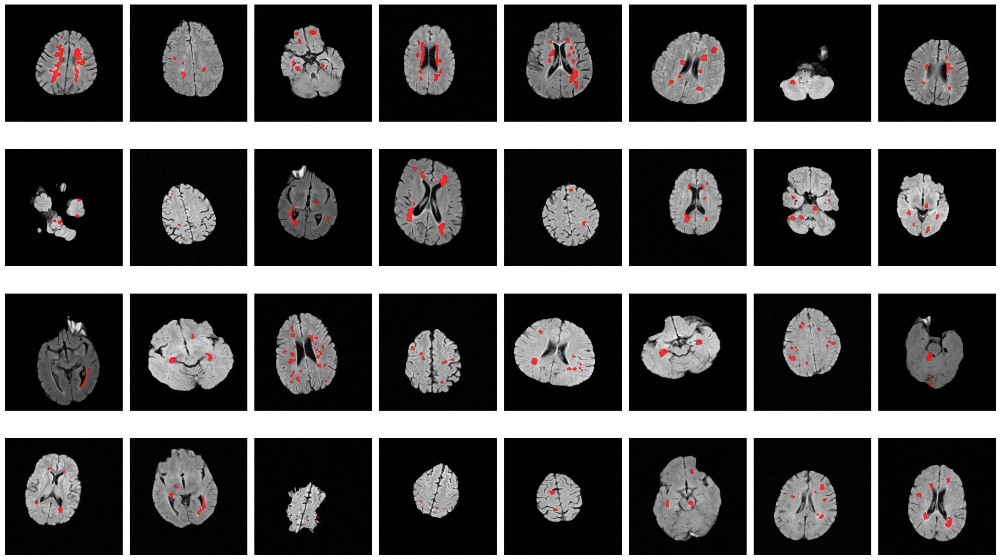

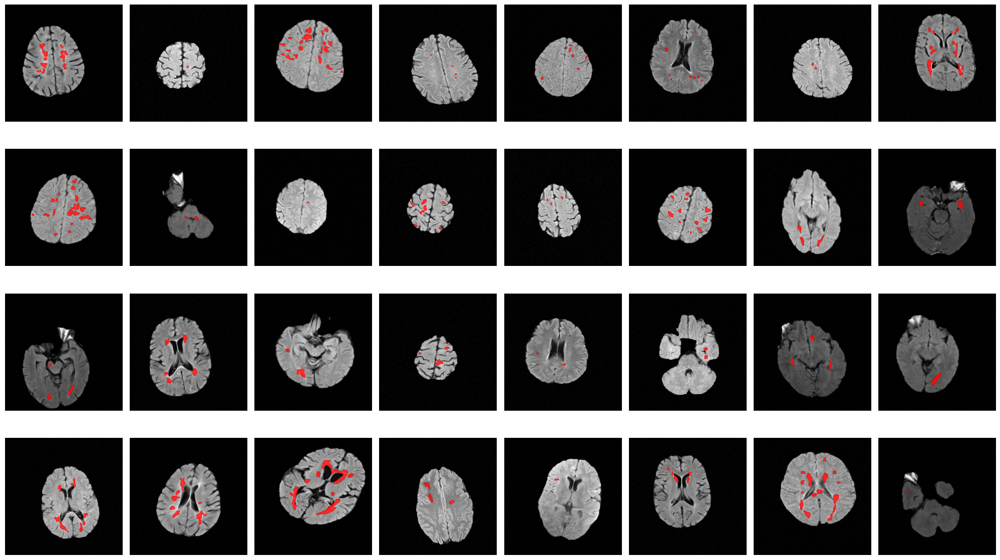

In [14]:
# Display augmented batches to check mask alignment
for n_batch in range(2):
    batch_slices, batch_masks = next(iterator_train)
    display_slices(batch_slices, batch_masks, alpha=0.8, rows=4)

## Model Training

In [15]:
import tensorflow as tf

tf.get_logger().setLevel('WARNING') # Suppress TensorFlow info messages

# Create and compile the model
model = build_unet_resnet50(input_shape=(256, 256, 1))
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 256, 256,  │          0 │ input_layer[0][0… │
│ (Concatenate)       │ 3)                │            │ input_layer[0][0… │
│                     │                   │            │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional          │ [(None, 128, 128, │ 23,587,712 │ concatenate[0][0] │
│ (Functional)        │ 64), (None, 64,   │            │                   │
│                     │ 64, 256), (None,  │            │                   │
│                     │ 32, 32, 512),     │            │                   │
│                     │ (None, 16, 16,    │            │                   │
│                     │ 1024), (None, 8,  │            │                   │
│                     │ 8, 2048)]         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 16, 16,    │          0 │ functional[0][4]  │
│ (UpSampling2D)      │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 16, 16,    │          0 │ up_sampling2d[0]… │
│ (Concatenate)       │ 3072)             │            │ functional[0][3]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 16, 16,    │ 14,156,288 │ concatenate_1[0]… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 16, 16,    │  2,359,808 │ conv2d[0][0]      │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 16, 16,    │          0 │ conv2d_1[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 32, 32,    │          0 │ dropout[0][0]     │
│ (UpSampling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 32, 32,    │          0 │ up_sampling2d_1[… │
│ (Concatenate)       │ 1024)             │            │ functional[0][2]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 32, 32,    │  2,359,552 │ concatenate_2[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 32, 32,    │    590,080 │ conv2d_2[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_2     │ (None, 64, 64,    │          0 │ dropout_1[0][0]   │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 64, 64,    │          0 │ up_sampling2d_2[

 Total params: 43,938,625 (167.61 MB)

 Trainable params: 43,885,505 (167.41 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [16]:
# Train model
iterator_train, iterator_val = get_augment_iterators(all_slices_train, all_masks_train, all_slices_val, all_masks_val, SEED, BATCH_SIZE)
model, history = train_model(model, iterator_train, iterator_val, steps_per_epoch, validation_steps)

Epoch 1/20


/home/aimfeld/miniconda3/envs/hslu-vision/lib/python3.10/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_2']. Received: the structure of inputs=*
  warnings.warn(


15/15 ━━━━━━━━━━━━━━━━━━━━ 121s 7s/step - dice_coefficient: 0.0064 - loss: 10.1871 - val_dice_coefficient: 4.3979e-05 - val_loss: 9.1013
Epoch 2/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 100s 7s/step - dice_coefficient: 0.0151 - loss: 8.8038 - val_dice_coefficient: 0.0586 - val_loss: 8.0052
Epoch 3/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 100s 7s/step - dice_coefficient: 0.1255 - loss: 7.7310 - val_dice_coefficient: 0.1531 - val_loss: 7.1580
Epoch 4/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 99s 7s/step - dice_coefficient: 0.4068 - loss: 6.6980 - val_dice_coefficient: 0.4273 - val_loss: 6.1089
Epoch 5/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 98s 7s/step - dice_coefficient: 0.5135 - loss: 5.8714 - val_dice_coefficient: 0.3994 - val_loss: 5.4426
Epoch 6/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 100s 7s/step - dice_coefficient: 0.5415 - loss: 5.1910 - val_dice_coefficient: 0.4565 - val_loss: 4.8036
Epoch 7/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 110s 7s/step - dice_coefficient: 0.5652 - loss: 4.5989 - val_dice_coefficient: 0.5210 - val_loss: 4.2434
Epoch 8

In [17]:
# Evaluate model
evaluation = model.evaluate(iterator_val, steps=validation_steps)
print(f"Validation Loss: {evaluation[0]}")
print(f"Validation Dice Coefficient: {evaluation[1]}")

4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - dice_coefficient: 0.5351 - loss: 4.2346
Validation Loss: 4.239467620849609
Validation Dice Coefficient: 0.5307604670524597


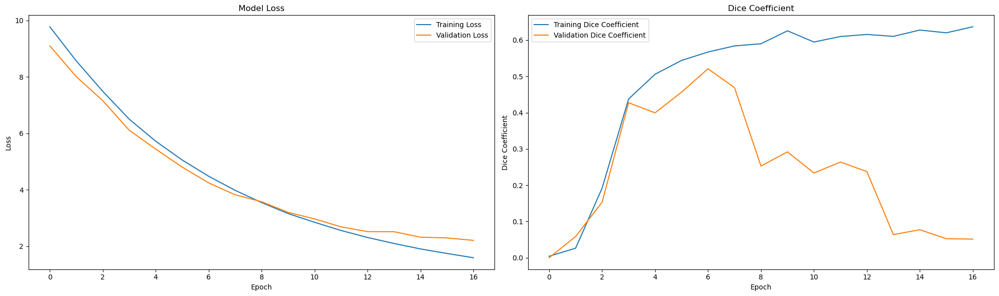

In [18]:
plot_training_history(history)

In [19]:
all_preds = model.predict(all_slices_val)
all_preds_binary = np.where(all_preds > 0.5, 1, 0)

5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step


Display the predictions for all validation slices
- Red: Lesion mask (ground truth)
- Blue: Predicted lesion
- Yellow: Overlap

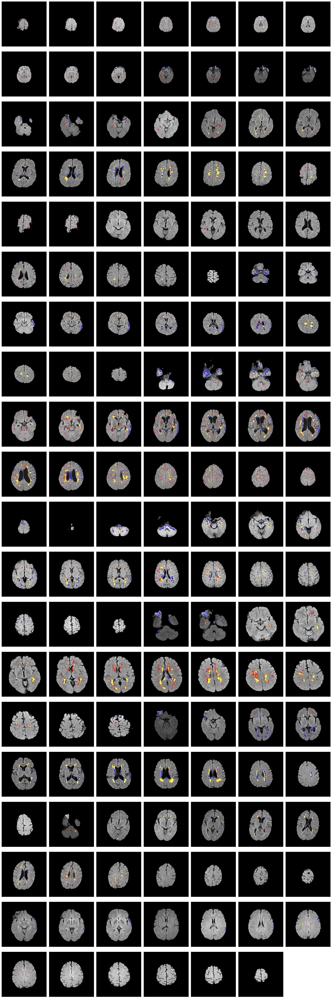

In [20]:
display_slices(all_slices_val, all_masks_val, all_preds_binary, alpha=0.7, rows=20)

## Hyperparameter Tuning

In [21]:
# iterator_train, iterator_val = get_augment_iterators(all_slices_train, all_masks_train, all_slices_val, all_masks_val, SEED, BATCH_SIZE)
# tuner = hyperparam_tuning(iterator_train, iterator_val, 20, steps_per_epoch, validation_steps)
# tuner.results_summary(3)

In [22]:
# # Load tuner from hyperparam_tuning directory
# tuner = get_tuner()
# 
# # Get the optimal hyperparameters
# best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
# best_hps.values

## Train and Evaluate Tuned Model

In [23]:
# Build the model with the optimal hyperparameters
# hp_model = tuner.hypermodel.build(best_hps)
# We use the determined hyperparameters from google colab, as local tuning is not feasible due 
# to memory leaks.
hp_model = build_unet_resnet50(l2_reg=2.2589e-05, dropout=0.1)

# Train the model with the optimal hyperparameters
iterator_train, iterator_val = get_augment_iterators(all_slices_train, all_masks_train, all_slices_val, all_masks_val, SEED, BATCH_SIZE)
hp_model, hp_history = train_model(hp_model, iterator_train, iterator_val, steps_per_epoch, validation_steps, learning_rate=0.00021979, best_model_file='best_hp_model.keras')

Epoch 1/20


/home/aimfeld/miniconda3/envs/hslu-vision/lib/python3.10/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_206']. Received: the structure of inputs=*
  warnings.warn(


15/15 ━━━━━━━━━━━━━━━━━━━━ 117s 7s/step - dice_coefficient: 0.0030 - loss: 0.6451 - val_dice_coefficient: 0.0022 - val_loss: 0.5467
Epoch 2/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 97s 7s/step - dice_coefficient: 0.0412 - loss: 0.5157 - val_dice_coefficient: 0.1276 - val_loss: 0.4831
Epoch 3/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 97s 7s/step - dice_coefficient: 0.2989 - loss: 0.3888 - val_dice_coefficient: 0.2535 - val_loss: 0.4357
Epoch 4/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 97s 6s/step - dice_coefficient: 0.4534 - loss: 0.3081 - val_dice_coefficient: 0.3574 - val_loss: 0.3735
Epoch 5/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 97s 6s/step - dice_coefficient: 0.5629 - loss: 0.2506 - val_dice_coefficient: 0.5155 - val_loss: 0.2836
Epoch 6/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 96s 6s/step - dice_coefficient: 0.5841 - loss: 0.2375 - val_dice_coefficient: 0.3709 - val_loss: 0.3723
Epoch 7/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 95s 6s/step - dice_coefficient: 0.5965 - loss: 0.2326 - val_dice_coefficient: 0.4745 - val_loss: 0.3174
Epoch 8/20
15/15

In [24]:
# Evaluate model
evaluation = hp_model.evaluate(iterator_val, steps=validation_steps)
print(f"Validation Loss: {evaluation[0]}")
print(f"Validation Dice Coefficient: {evaluation[1]}")

4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - dice_coefficient: 0.5861 - loss: 0.2497
Validation Loss: 0.24695494771003723
Validation Dice Coefficient: 0.5878577828407288


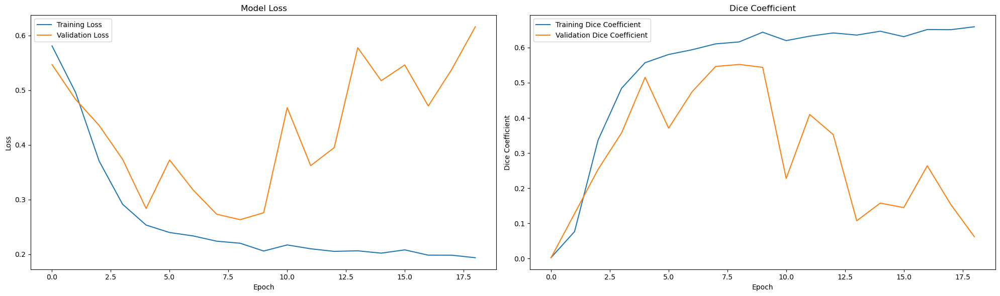

In [25]:
plot_training_history(hp_history)

5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step


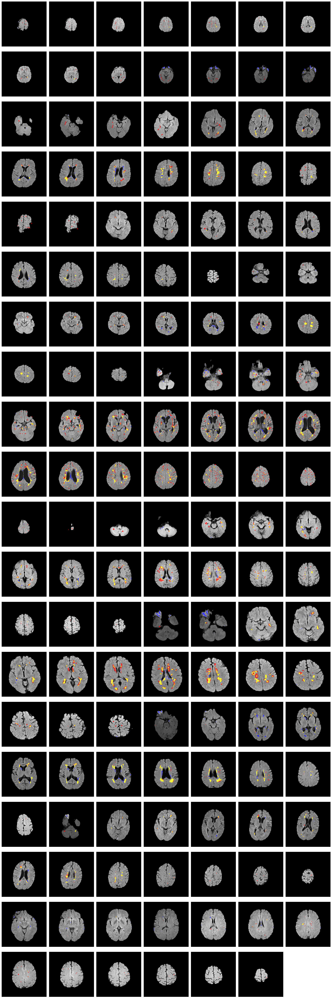

In [26]:
all_preds = hp_model.predict(all_slices_val)
all_preds_binary = np.where(all_preds > 0.5, 1, 0)
display_slices(all_slices_val, all_masks_val, all_preds_binary, alpha=0.7, rows=20)

## TensorBoard

In [27]:
# Load the TensorBoard extension
%load_ext tensorboard

# Start TensorBoard and point it to the 'logs' folder
%tensorboard --logdir logs/